Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

current prompt: a film still from trainspotting by patryk hardziej, an alley on an industrial planet city, vibrant, 5 0 mm lens, character design, behance hd, studio,


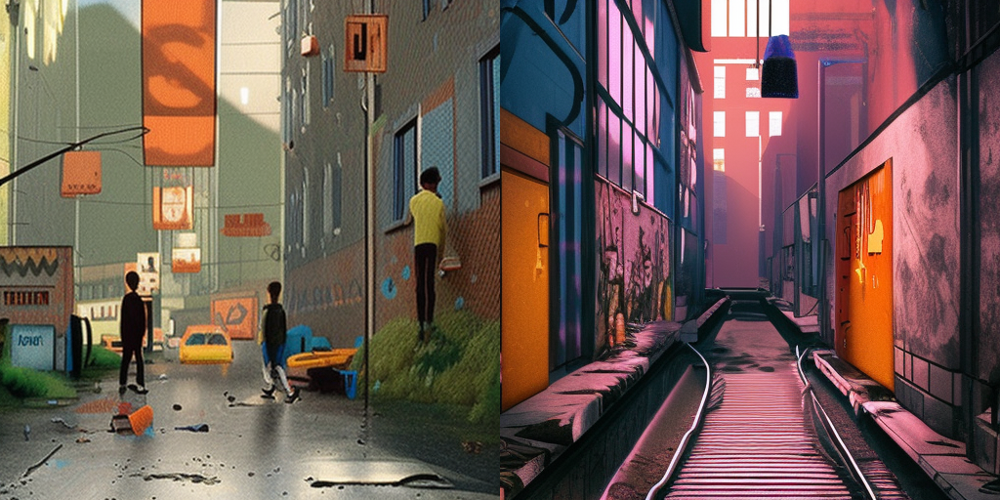

0
current prompt: side portrait, imogen poots, paladin, fantasy, gloomhaven, luminescent, organic painting, matte painting, bold shapes, hard edges, gaudy colors, octan


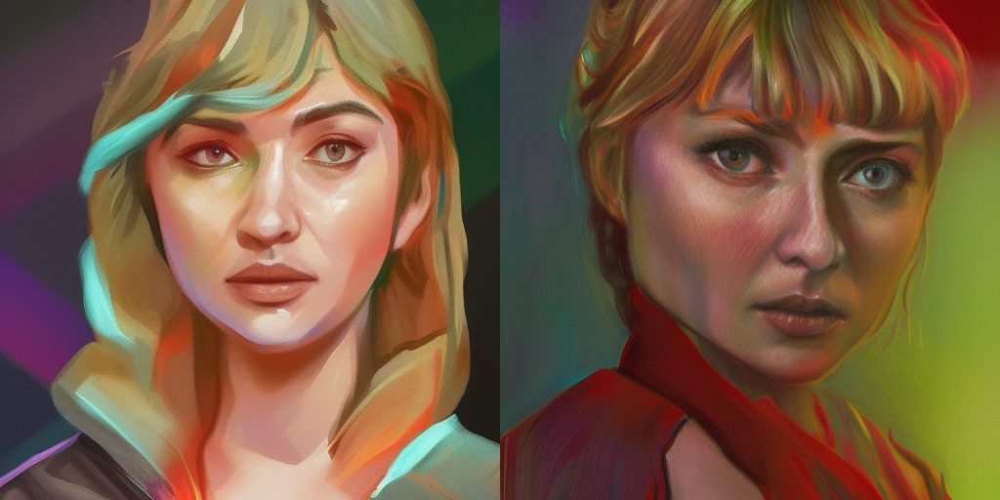

4
current prompt: man on bicycle in a land full of lanterns, cinematic view, epic sky, detailed, concept art, low angle, high detail, warm lighting, volumetric, godrays


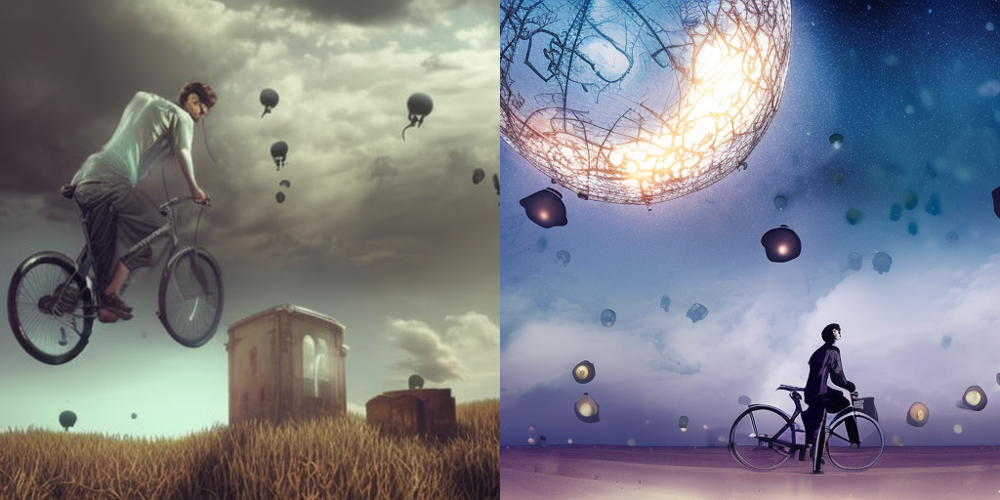

1
current prompt: full body, full figure portrait of gothic gritty old berserk batman, full body shot, highly detailed dramatic lighting, artstation, atmospheric perspe


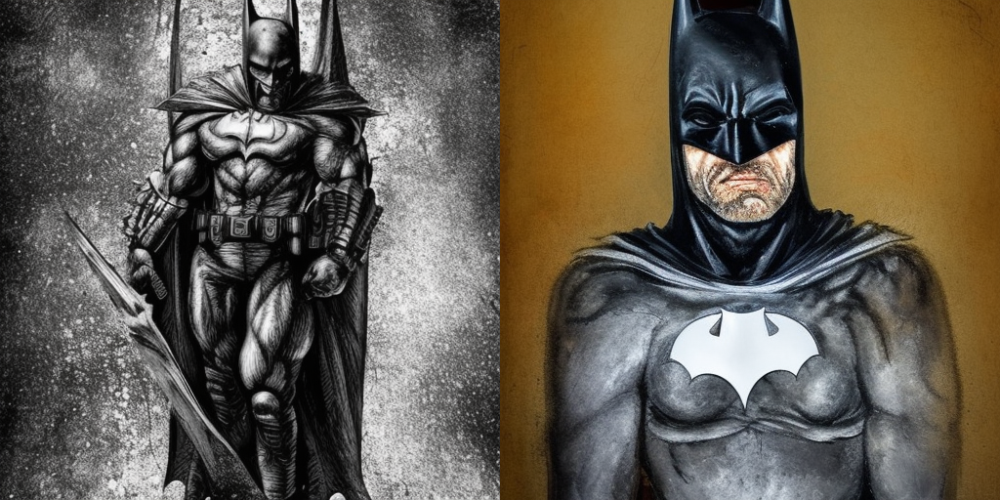

1
current prompt: an attractive young female wearing an blue ornate metallic helmet, adriana lima, olive skin, long dark hair, beautiful bone structure, intricate, eleg


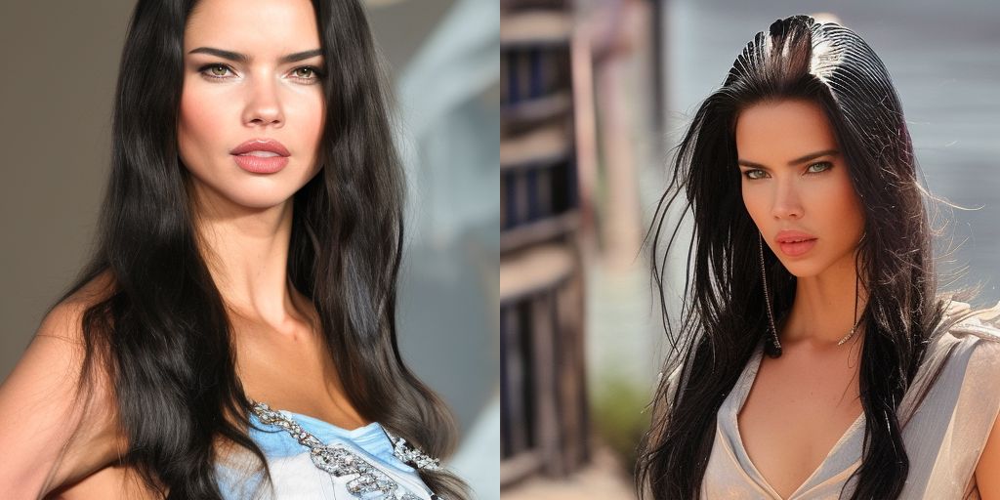

2
current prompt: ismail inceoglu epic painting of a zombie invasion movie poster art, line art!!, ink, art concept for a book cover!!, vibrant colours, oil on canvas p


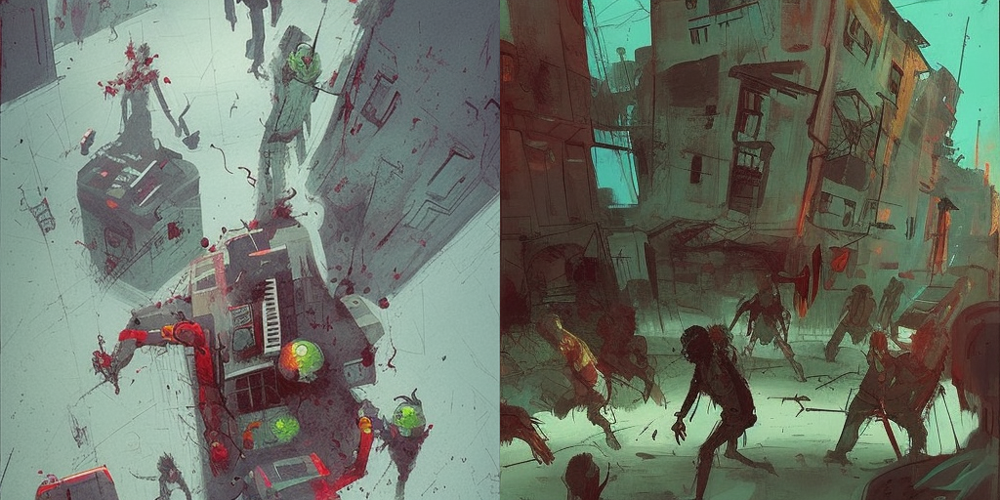

1
current prompt: sansa angeline jolie gessica chastain mummy cleopatra gold blood, intricate, elegant, highly detailed, digital painting, artstation, concept art, smoo


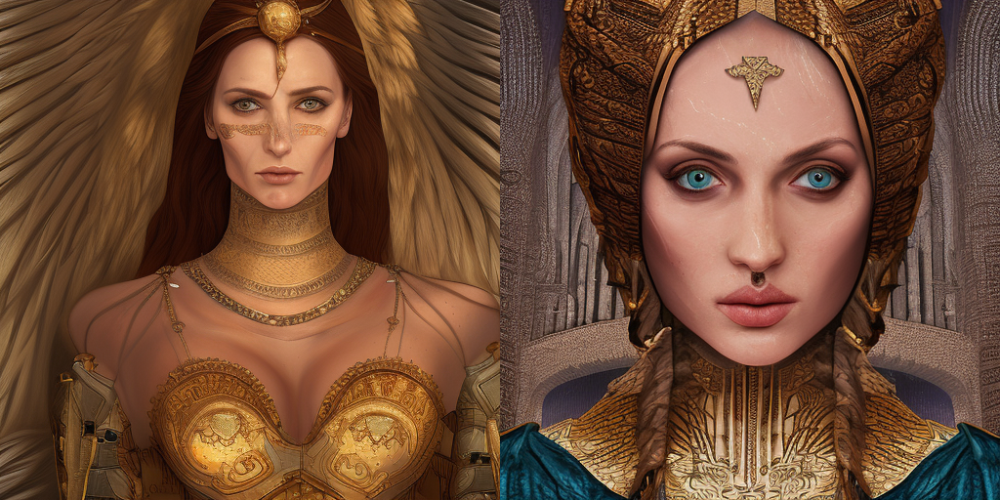

1
current prompt: two humanoid german shepherds beast - men, sitting on a couch and hugging together, artstation, concept art, smooth, sharp foccus ilustration, artstat


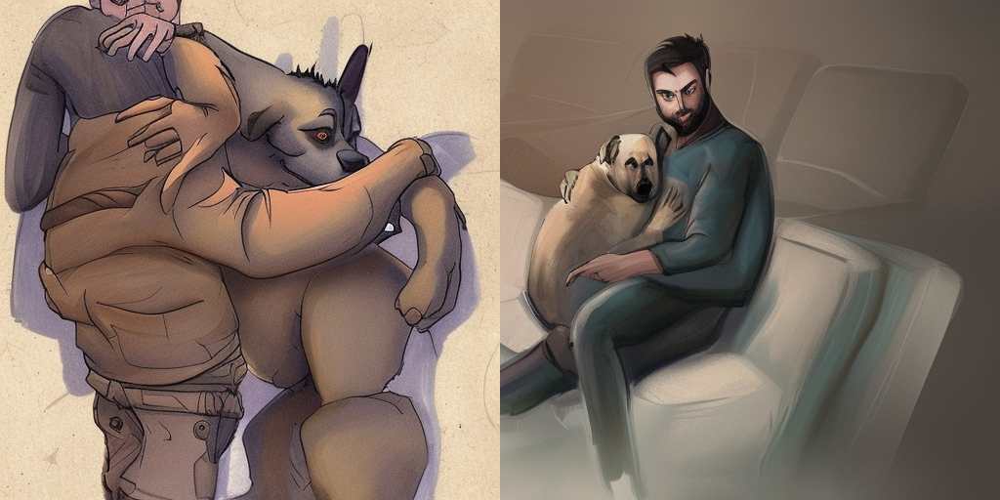

1
current prompt: rock and rollers drinking brutal and raw wine, inside a tiny green room with red lights by joaquin sorolla, greg rutkowski, bill sienckiwicz, extremel


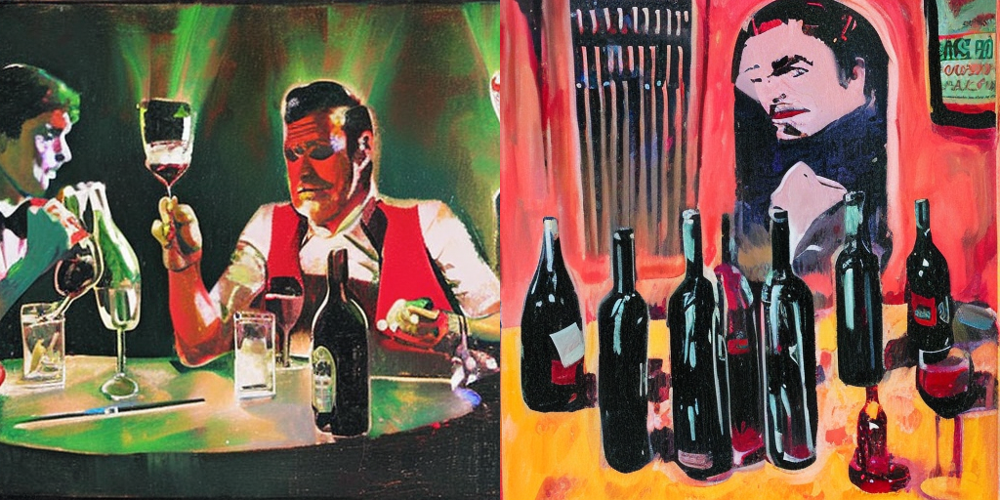

2
current prompt: a _ fantasy _ style _ portrait _ painting _ of white girl, dark ponytail hair, smiling, round face, rpg dnd oil _ painting _ unreal _ 5 _ daz. _ rpg _


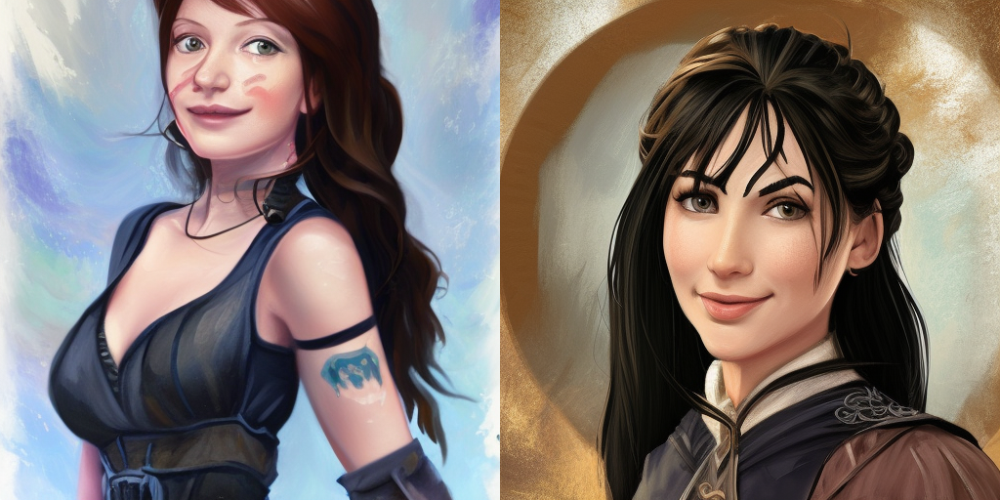

1
loss bits 1.399999976158142
bit acc percentage 97.08%
loss 0.024722889065742493
bit error average 1.40
bit error correct average 0.30
detection rate (without correction): 1.00


In [1]:
import argparse
from tqdm.auto import tqdm
import torch
import matplotlib.pyplot as plt
from utils import *
import random
import numpy as np
import math
import os 
import scipy
import torch.nn as nn
from modified_stable_diffusion import ModifiedStableDiffusionPipeline
import PIL
from PIL import Image, ImageFilter,ImageEnhance
import commpy.utilities as util
import cv2
from bm3d import bm3d_rgb

if __name__ == '__main__':
    parser = argparse.ArgumentParser(description='diffusion watermark')
    parser.add_argument('--w_seed', default=0, type=int)
    parser.add_argument('--dataset', default='Gustavosta/Stable-Diffusion-Prompts')
    # parser.add_argument('--dataset', default='coco')
    # parser.add_argument('--dataset', default='stablediffusionDB')
    parser.add_argument('--model_path', default='../stable-diffusion-2-1-base')
    # parser.add_argument('--model_path', default='../stable-diffusion-v1-4')
    parser.add_argument('--image_length', default=512, type=int)
    parser.add_argument('--secret_length', default=48, type=int)
    parser.add_argument('--num_inference_steps', default=25, type=int)
    parser.add_argument('--guidancescale', default=4, type=float)
    parser.add_argument('--reverse_inference_steps', default=25, type=int)
    # parser.add_argument('--model', default='./encoder_decoder_pretrain/model48bit.pth', type=str)
    parser.add_argument('--model', default='./model48bit_finetuned.pth', type=str)
    # parser.add_argument('--model', default='./model48bit_finetuned_backup.pth', type=str)
    parser.add_argument('--birghtness', default=None, type=float,choices=[1,2,3,4,5])
    parser.add_argument('--noise', default=None, type=float,choices=[0.01,0.05])
    parser.add_argument('--contrast', default=None, type=float,choices=[1,2,3,4,5])
    parser.add_argument('--hue', default=None, type=float,choices=[0.25,2])
    parser.add_argument('--blur', default=None, type=int,choices=[1,3,5])
    parser.add_argument('--jpegcompression', default=None, type=int,choices=[40,50])
    parser.add_argument('--resize', default=None, type=float,choices=[0.4,0.8])
    parser.add_argument('--bm3d', default=None, type=float,choices=[10,20])
    args =parser.parse_known_args()[0]
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    torch.set_printoptions(sci_mode=False,profile='full')
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"
    maxlength=150
    
# dataset
dataset, prompt_key = get_dataset(args)
dataset=promptdataset(dataset,prompt_key)

#model
scheduler = DPMSolverMultistepScheduler.from_pretrained(args.model_path, subfolder='scheduler')
pipe = ModifiedStableDiffusionPipeline.from_pretrained(
        args.model_path,
        scheduler=scheduler,
        torch_dtype=torch.float16,
        revision='fp16',
        )
pipe = pipe.to(device)

#diffusetrace
from encoder_decoder_pretrain.watermark_model import *
encoder=Watermark(secret_length=args.secret_length).to(device)
if args.model !=None:
    encoder.load_state_dict(torch.load(args.model))
encoder.eval()

#rsc codes
import commpy.channelcoding.convcode as cc
memory = np.array(2, ndmin=1)
g_matrix = np.array((0o5, 0o7), ndmin=2)
trellis = cc.Trellis(memory, g_matrix)

Metric,Loss,Error_correct=[],[],[]
for t in tqdm(range(10)):
    initial_latents=get_random_latents(pipe,args)
    init_latents=initial_latents.detach().clone()
    secret_ori=np.random.choice([0, 1], size=(args.secret_length//2))
    secret = cc.conv_encode(secret_ori,trellis,'cont')
    secret = torch.Tensor(secret).unsqueeze(-1).unsqueeze(-1).unsqueeze(0).to(device)
    secret = secret.expand(-1,-1,64,64)
    matrix1,mean,logvar=encoder(secret)
    mean=mean.reshape(-1,4,64,64)
    logvar=logvar.reshape(-1,4,64,64)
    eps = torch.randn_like(logvar)
    std = torch.exp(logvar / 2)
    matrix = eps * std + mean
    init_latents=matrix.half()

    prompt=dataset[random.randint(1, len(dataset))][0:maxlength]
    # prompt=dataset[t+100][0:maxlength]
    print(f"current prompt: {prompt}")
    img1= pipe(prompt=prompt,num_inference_steps=args.num_inference_steps,\
    latents=init_latents,guidance_scale=args.guidancescale).images[0]
    
    img2= pipe(prompt=prompt,num_inference_steps=args.num_inference_steps,\
    latents=initial_latents,guidance_scale=args.guidancescale).images[0]
    
    if args.birghtness != None:
                img1 = transforms.ColorJitter(brightness=args.birghtness)(img1)
    if args.noise != None:
                img1 = np.array(img1, dtype=np.uint8)
                g_noise = np.random.randn(*img1.shape).astype(np.uint8) * args.noise
                noisy_array = np.clip(img1.astype(np.float32) + g_noise, 0, 255).astype(np.uint8)
                img1 = Image.fromarray(noisy_array)
    if args.contrast != None:
                enhancer = ImageEnhance.Contrast(img1)
                factor = args.contrast
                img1= enhancer.enhance(factor)
    if args.hue != None:
                enhancer = ImageEnhance.Color(img1)
                factor = args.hue
                img1 = enhancer.enhance(factor)
    if args.jpegcompression != None:
                img1=compress_jpeg_to_pil(img1, args.jpegcompression)
    if args.blur != None:
                img1=Image.fromarray(cv2.GaussianBlur(np.array(img1),(args.blur,args.blur), 1))
    if args.resize != None:
                img1 = img1.resize((int(args.image_length*args.resize), int(args.image_length*args.resize)), PIL.Image.BICUBIC)
    if args.bm3d != None:
                rgb_array = np.array(img1)
                denoised_red = bm3d_rgb(rgb_array,sigma_psd=args.bm3d)
                img1 = Image.fromarray(denoised_red.astype(np.uint8))
    
    
    
    import torchvision.transforms.functional as TF
    tensor1 = TF.to_tensor(img1)
    tensor2 = TF.to_tensor(img2)
    concatenated_tensor = torch.cat((tensor1, tensor2), dim=2)
    concatenated_image = TF.to_pil_image(concatenated_tensor)
    concatenated_image.show()
    
    reverse_latents=reverse(img1,pipe,args).float()
    reverse_latents = reverse_latents.view(1, -1)
    x = encoder.decoder_projection(reverse_latents)
    x = torch.reshape(x, (-1, *encoder.decoder_input_chw))

    average_tensor1 = torch.mean(secret, dim=(-2, -1))
    average_tensor2 = torch.round(torch.mean(encoder.decoder(x), dim=(-2, -1)))
    average_tensor3 = torch.mean(encoder.decoder(x), dim=(-2, -1))
    matrix_ori=torch.mean(matrix1, dim=(-2, -1))

    biterror=torch.sum(abs(average_tensor1-average_tensor2))
    mse_loss = torch.nn.MSELoss()
    loss = mse_loss(average_tensor3, average_tensor1)
    
    decoded_bits = cc.viterbi_decode(np.array(average_tensor2[0].detach().cpu()).astype(float), trellis, 5)
    num_bit_errors = util.hamming_dist(secret_ori, decoded_bits[:args.secret_length//2])
    Error_correct.append(num_bit_errors)
    
    print(int(biterror.detach().cpu().numpy()))
    # print(biterror)
    
    Metric.append(biterror)
    Loss.append(loss)
    
biterror=torch.mean(torch.stack(Metric))
biterrper=biterror/args.secret_length
metric=torch.mean(torch.stack(Loss))
correctbit_err=np.mean(Error_correct)
detection_rate = 1 - sum(1 for i in Metric if i > 14) / len(Metric)
print(f'loss bits',f'{biterror.cpu().detach().numpy()}')
print(f'bit acc percentage {(1-biterrper)*100:.2f}%')
print(f'loss',f'{metric.cpu().detach()}')
print(f'bit error average',f'{biterror.detach().cpu().numpy():.2f}')
print(f'bit error correct average',f'{correctbit_err:.2f}')
print(f'detection rate (without correction): {detection_rate:.2f}')